# HW2 

In this homework we look at a (naive but we will get better) way of computing homographies between images. 

1. image1 shows a picture on a wall. Our goal is to replace that picture with image2. 
In order to do this we will compute the H matrix that defines the transformation between the two images and then map image2 in place on image1. 

Several things to consider. You can use the four corner points in each image to setup up the computation of the H matrix and then map every pixel as needed.


Please write up your work and put all your code in a python notebook and check into  your class Gitlab folder

Note 0: Feel free to use a cursor to hand pick the corners in the image

Note 1: Pixel values may not fall on exact integer values. You can use the following call (or something like it to warp the image).

```
# Warp source image to destination based on homography
im_out = cv2.warpPerspective(im_src, h,(im_dst.shape[1],im_dst.shape[0]))
```

Note 2: Of course we can do the homography calculation very easily in openCV as well with the following call (below) but in this homework we want to peek under the hood and figure it out for ourselves. 

```
# Calculate Homography
h, status = cv2.findHomography(pts_src, pts_dst)
```


In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from collections import namedtuple

In [2]:
def bgr_to_rgb(bgr_img):
    b,g,r = cv2.split(bgr_img)       # get b,g,r
    rgb_img = cv2.merge([r,g,b])     # switch it to rgb
    return rgb_img

In [3]:
img1 = cv2.imread('image1.jpg')
img1 = bgr_to_rgb(img1)
img2 = cv2.imread('image2.jpg')
img2 = bgr_to_rgb(img2)

<IPython.core.display.Javascript object>


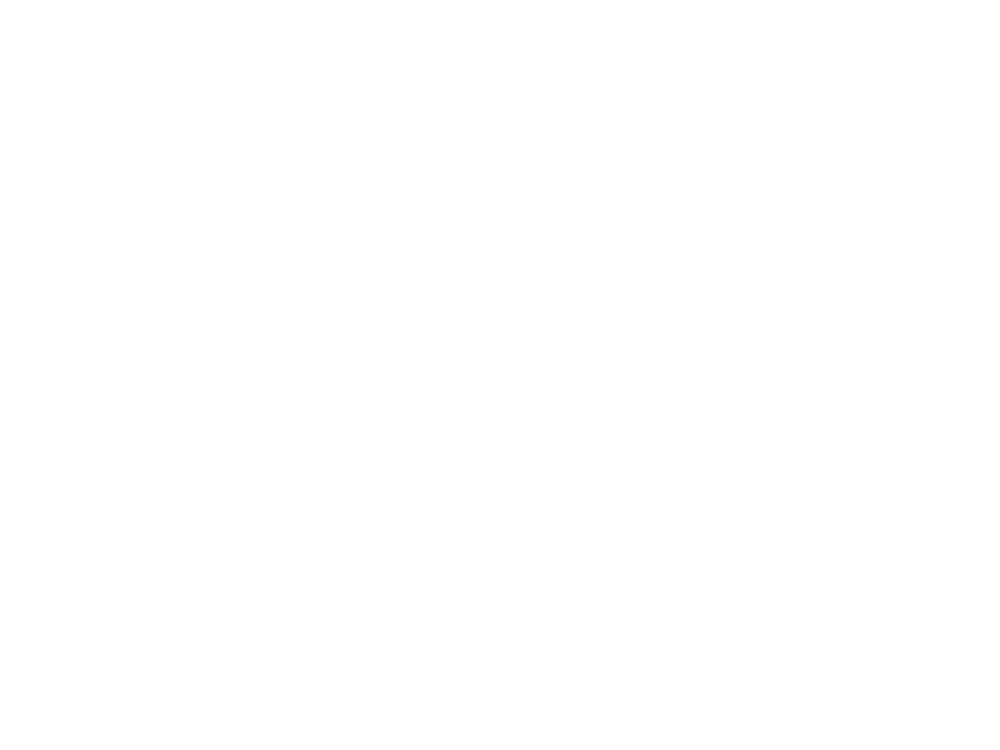

<IPython.core.display.Javascript object>


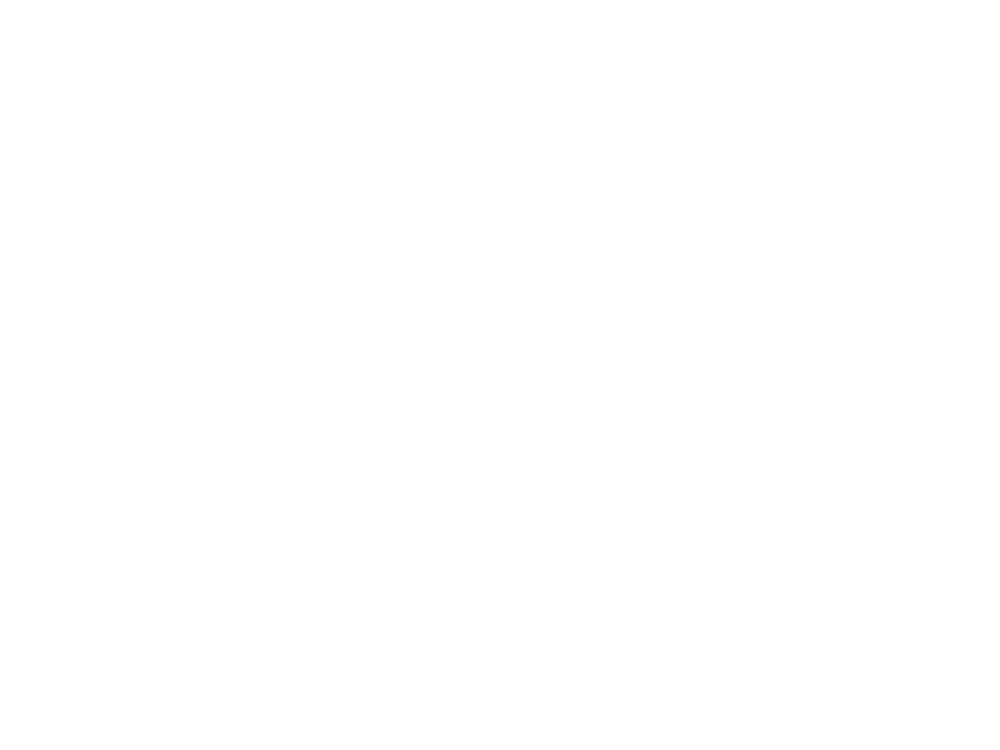

In [4]:
# Make Matplotlib interactive so I can handpick points
%matplotlib notebook

plt.figure()
plt.imshow(img1)
plt.figure()
plt.imshow(img2)


plt.show()

In [5]:
# Okay enough of that. Please reset it to be normal again. 
%matplotlib inline
Point = namedtuple('Point', 'x y')


# Handpicked Points from Image 1
image1_tl = Point(515, 482)
image1_tr = Point(941, 436)
image1_bl = Point(550, 1103)
image1_br = Point(968, 1168)
image1_points = [image1_tl, image1_tr, image1_bl, image1_br]

# Handpicked Points from Image 2
image2_tl = Point(51, 128)
image2_tr = Point(370, 128)
image2_bl = Point(35, 386)
image2_br = Point(386, 386)
# Alternatively, use the entire image
height, width, channels = img2.shape
image2_tl = Point(0, 0)
image2_tr = Point(width, 0)
image2_bl = Point(0, height)
image2_br = Point(width, height)
image2_points = [image2_tl, image2_tr, image2_bl, image2_br]


Construct the following. 
![H_equation](h_equation.png)

In [6]:
def make_x_row(src: Point, dest: Point):
    return np.array([src.x, src.y, 1, 0, 0, 0, -src.x*dest.x, -src.y*dest.x])

def make_y_row(src: Point, dest: Point):
    return np.array([0, 0, 0, src.x, src.y, 1, -src.x*dest.y, -src.y*dest.y])

def make_a(src_pts, dest_pts):
    assert(len(src_pts) == len(dest_pts))
    A = None
    
    for index in range(len(src_pts)): 
        x_row = make_x_row(src_pts[index], dest_pts[index])
        y_row = make_y_row(src_pts[index], dest_pts[index])
        if A is None:
            A = np.array([x_row, y_row]) 
        else:
            A = np.vstack([A, x_row, y_row])
    return A

def make_b(dest_pts):
    b = []
    
    for point in dest_pts:
        b.append(point.x)
        b.append(point.y)

    return b

Solve for H using the following. 
![H_equation2](h_equation2.png)

| Matlab     | Numpy                     | Description |
|:-----------|---------------------------|-------------|
|a\b	     |linalg.solve(a,b) if a is square; linalg.lstsq(a,b) otherwise| 	solution of a x = b for x|

In [7]:
def isSquare (m): 
    return all (len (row) == len (m) for row in m)

def find_h(A, b):
    if isSquare(A):
        H = np.linalg.solve(A, b)
    else:
        result = np.linalg.lstsq(A,b,rcond=None)
        H = result[0]
        
    H = np.append(H, [1])
    H = np.reshape(H, (3, 3))
    return H



In [8]:
A = make_a(image2_points, image1_points)
b = make_b(image1_points)

print("A: \n" + str(A))
print("b: \n" + str(b))

H = find_h(A, b)

print("H: \n" + str(H))

A: 
[[      0       0       1       0       0       0       0       0]
 [      0       0       0       0       0       1       0       0]
 [    450       0       1       0       0       0 -423450       0]
 [      0       0       0     450       0       1 -196200       0]
 [      0     446       1       0       0       0       0 -245300]
 [      0       0       0       0     446       1       0 -491938]
 [    450     446       1       0       0       0 -435600 -431728]
 [      0       0       0     450     446       1 -525600 -520928]]
b: 
[515, 482, 941, 436, 550, 1103, 968, 1168]
H: 
[[ 6.24168381e-01  1.14361671e-01  5.15000000e+02]
 [-2.51647571e-01  1.46434510e+00  4.82000000e+02]
 [-3.42718689e-04  6.52478816e-05  1.00000000e+00]]


`H` now holds the Homography from image2 into image1

In [9]:
def convert_points(points):
    pts = [[point.x, point.y] for point in points]
    return np.array(pts)

def check_h(H, pts_src, pts_dest):
    h, status = cv2.findHomography(convert_points(pts_src), convert_points(pts_dest))
    diff = sum(sum(h-H))
    if abs(diff) < 1:
        print("H is good!")
        return H
    else:
        print("H is not good!")
        return h

    print("Diff of {}".format(diff))

check_h(H, image2_points, image1_points)

H is good!


array([[ 6.24168381e-01,  1.14361671e-01,  5.15000000e+02],
       [-2.51647571e-01,  1.46434510e+00,  4.82000000e+02],
       [-3.42718689e-04,  6.52478816e-05,  1.00000000e+00]])

the warped image
Intended Canvas


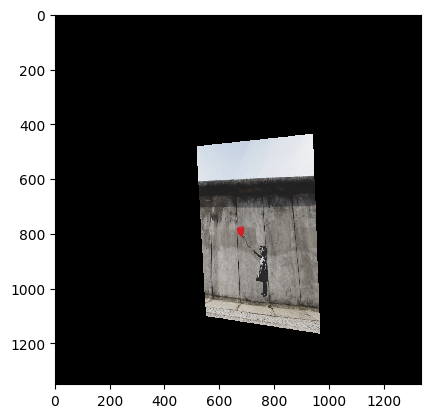

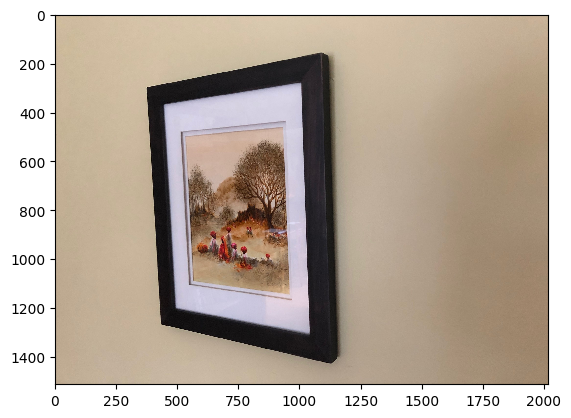

In [10]:
im_height, im_width, channels = img2.shape
scale = 3
print("the warped image")
plt.figure()
im_out = None
im_out = cv2.warpPerspective(img2, H, (im_height*scale, im_width*scale), borderMode=cv2.BORDER_TRANSPARENT)
plt.imshow(im_out)

print("Intended Canvas")
plt.figure()
plt.imshow(img1)

In [11]:
def combine_images2(image1, image2, anchor_y=0, anchor_x=0, alpha =.5):
    '''
    Put image1 ON TOP OF image 2
    '''
    # https://stackoverflow.com/questions/48979219/cv2-composting-2-images-of-differing-size
    
    foreground, background = image1.copy(), image2.copy()
    # Check if the foreground is inbound with the new coordinates and raise an error if out of bounds
    background_height = background.shape[1]
    background_width = background.shape[1]
    foreground_height = foreground.shape[0]
    foreground_width = foreground.shape[1]
    if foreground_height+anchor_y > background_height or foreground_width+anchor_x > background_width:
        raise ValueError("The foreground image exceeds the background boundaries at this location")

    # do composite at specified location
    start_y = anchor_y
    start_x = anchor_x
    end_y = anchor_y+foreground_height
    end_x = anchor_x+foreground_width
    
    blended_portion = cv2.addWeighted(foreground,
                alpha,
                background[start_y:end_y, start_x:end_x,:],
                1 - alpha,
                0,
                background)
    background[start_y:end_y, start_x:end_x,:] = blended_portion
    return background

def combine_via_mask(src, dest, mask):
    #https://stackoverflow.com/questions/51365126/combine-2-images-with-mask
    combined = dest.copy()
    combined[np.where(mask == 255)] = src[np.where(mask == 255)]
    return combined

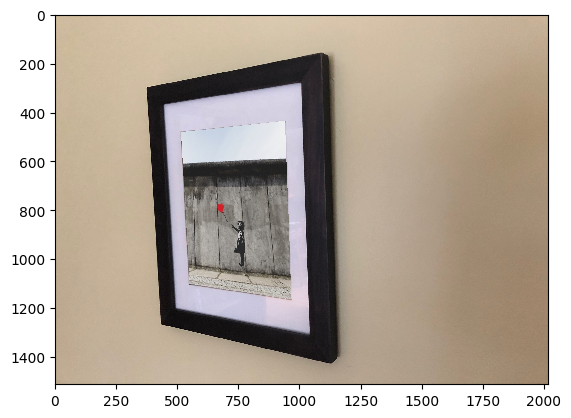

In [12]:
# Threshold the HSV image to get only black colors
black_mask = cv2.inRange(im_out, 0, 0)
im_mask = cv2.bitwise_not(black_mask)

combined = combine_via_mask(im_out, img1, im_mask) 
plt.imshow(combined)

2. Given what we learned about homographies and how they warp images can you pick four additional points from the two images. How would you modify the computation of the H matrix when you have an overconstrained problem (8 points as opposed to 4). Recompute H with these 8 points and comment on the differences in the H matrix. Map image3 on image1 as well with this new homography.

In [13]:
def mean(a, b):
    return int(float(a + b)/2)

# Handpicked Points from Image 1
image1_tl = Point(515, 482)
image1_tr = Point(941, 436)
image1_bl = Point(550, 1103)
image1_br = Point(968, 1168)
image1_tm = Point(mean(image1_tl.x, image1_tr.x), mean(image1_tl.y, image1_tr.y))
image1_bm = Point(mean(image1_bl.x, image1_br.x), mean(image1_bl.y, image1_br.y))
image1_rm = Point(mean(image1_tr.x, image1_br.x), mean(image1_tr.y, image1_br.y))
image1_lm = Point(mean(image1_tl.x, image1_bl.x), mean(image1_tl.y, image1_bl.y))
image1_points = [image1_tl, image1_tm, image1_tr, image1_bl, image1_bm, image1_br, image1_rm, image1_lm]


# Handpicked Points from Image 2
# Alternatively, use the entire image
height, width, channels = img2.shape
image2_tl = Point(0, 0)
image2_tr = Point(width, 0)
image2_bl = Point(0, height)
image2_br = Point(width, height)
image2_tm = Point(mean(image2_tl.x, image2_tr.x), mean(image2_tl.y, image2_tr.y))
image2_bm = Point(mean(image2_bl.x, image2_br.x), mean(image2_bl.y, image2_br.y))
image2_rm = Point(mean(image2_tr.x, image2_br.x), mean(image2_tr.y, image2_br.y))
image2_lm = Point(mean(image2_tl.x, image2_bl.x), mean(image2_tl.y, image2_bl.y))
image2_points = [image2_tl, image2_tm, image2_tr, image2_bl, image2_bm, image2_br, image2_rm, image2_lm]



In [14]:
A = make_a(image2_points, image1_points)
b = make_b(image1_points)
H = find_h(A, b)
h = check_h(H, image2_points, image1_points)
H = h

H is good!


the warped image
Intended Canvas


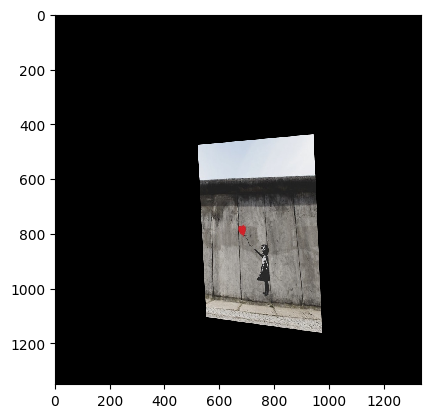

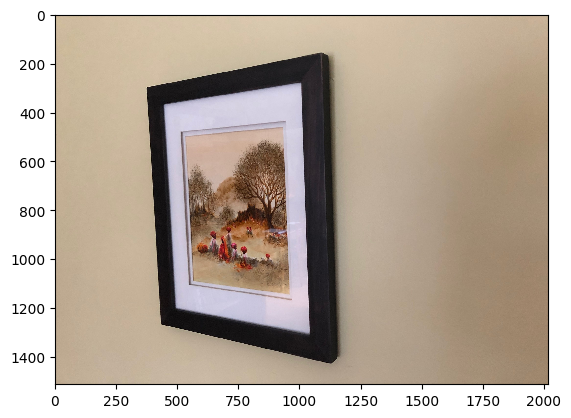

In [15]:
im_height, im_width, channels = img2.shape
scale = 3
print("the warped image")
plt.figure()
im_out = None
im_out = cv2.warpPerspective(img2, H, (im_height*scale, im_width*scale))
plt.imshow(im_out)

print("Intended Canvas")
plt.figure()
plt.imshow(img1)

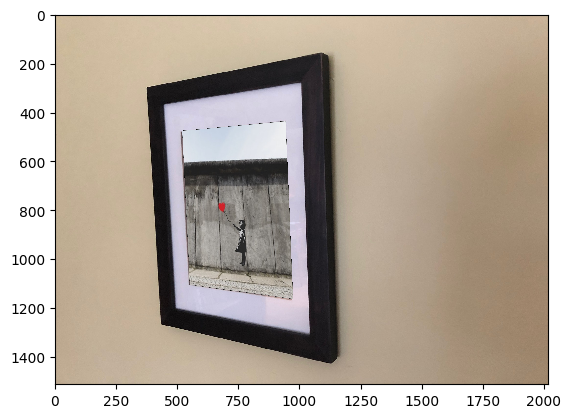

In [16]:
# Threshold the HSV image to get only black colors
black_mask = cv2.inRange(im_out, 0, 0)
im_mask = cv2.bitwise_not(black_mask)

plt.figure()
combined = combine_via_mask(im_out, img1, im_mask) 
plt.imshow(combined)

3. Can you now take multiple images (five?) and stitch them together into a mosaic. Try and stand in a spot and rotate the camera to take multiple overlapping images and then compute the homographies and map the images onto each other while blending them.
Again we are picking four points common across each image. 

Think about how you would pick the points – collinearity, spacing etc. 

To do a simple blend you can follow the instructions here. 
https://docs.opencv.org/3.4/d5/dc4/tutorial_adding_images.html


Also here is a hint for your panorama: Use the center image as image 0 and map the homographies from the center outwards.

In [17]:
# Load images for panorama
folder = "imgs/northeastern/"
fns = ['m1', 'm2', 'm3', 'm4', 'm5']
ftype = ".JPG"
imgs = {}
scale = .1

for file in fns:
    filename = folder + file + ftype
    imgs[file] = cv2.imread(filename)
    imgs[file] = bgr_to_rgb(imgs[file])
    imgs[file] = cv2.resize(imgs[file], (0,0), fx=scale, fy=scale)

<IPython.core.display.Javascript object>


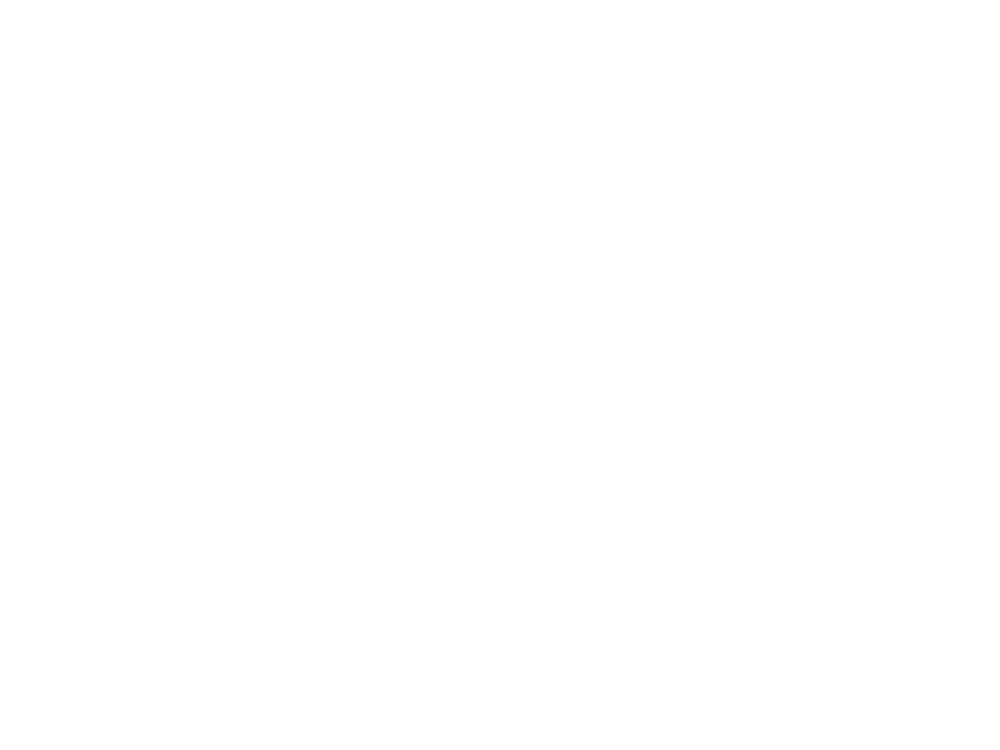

<IPython.core.display.Javascript object>


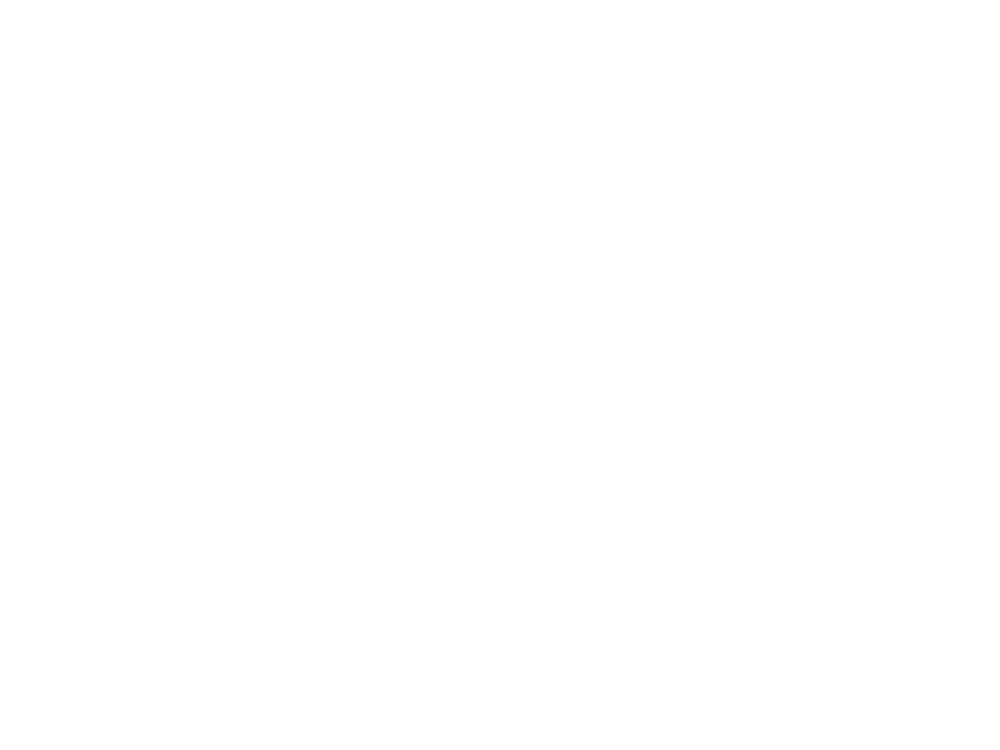

<IPython.core.display.Javascript object>


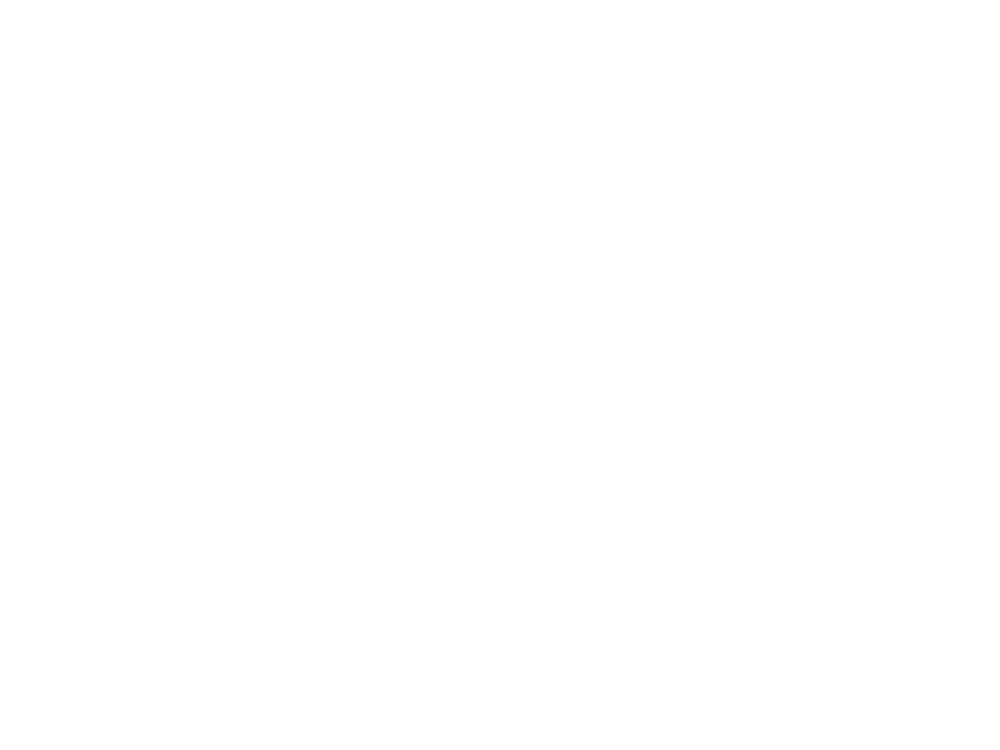

<IPython.core.display.Javascript object>


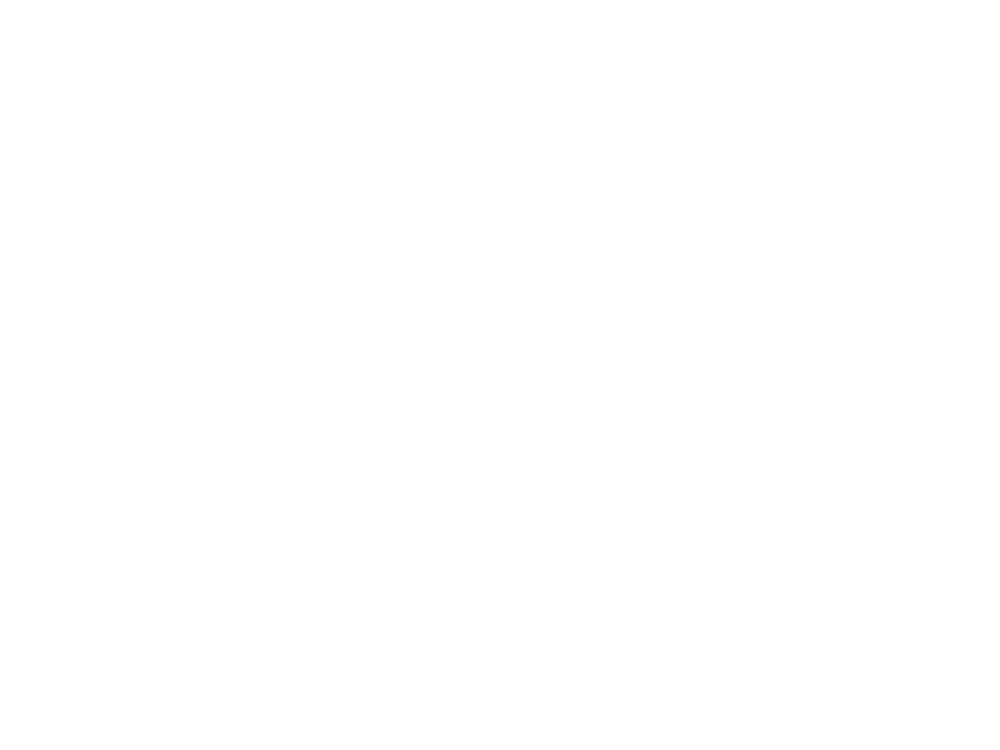

<IPython.core.display.Javascript object>


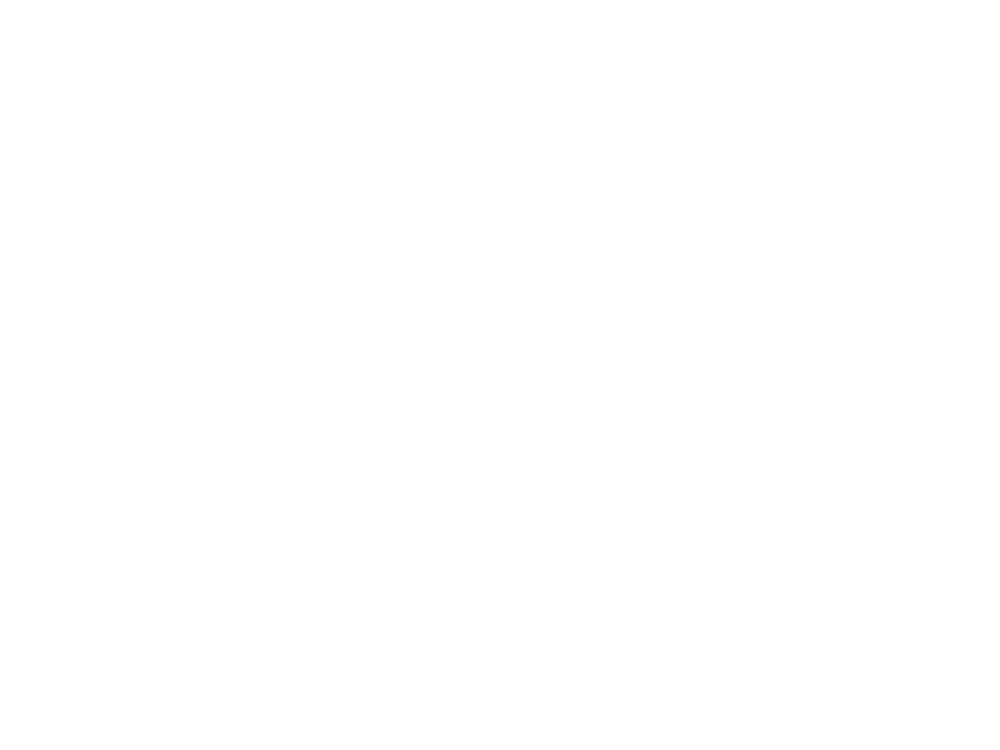

In [18]:
# Make Matplotlib interactive so I can handpick points
%matplotlib notebook
for file in fns:
    plt.figure()
    plt.imshow(imgs[file])

plt.show()

In [19]:
%matplotlib inline

In [20]:
# Get all the hand picked points

# Northeastern Pictures
im1_to_2 = {
    "im1": [
        Point(102, 128),
        Point(284, 134),
        Point(118, 260),
        Point(278,253)

    ],
    "im2": [
        Point(5, 118),
        Point(188, 140),        
        Point(19, 261),
        Point(180, 250)
    ]
}
im2_to_3 = {
    "im2": [
        Point(146, 123),
        Point(163, 251),
        Point(280, 46),
        Point(295, 259)

    ],
    "im3": [
        Point(16, 110),
        Point(28, 259),        
        Point(156, 59),
        Point(156, 265)
    ]
}

im3_to_4 = {
    "im3": [
        Point(156, 59),
        Point(179, 246),
        Point(287,126),
        Point(292, 240)

    ],
    "im4": [
        Point(3, 35),
        Point(17, 242),        
        Point(132,131),
        Point(129, 237)
    ]
}
im4_to_5 = {
    "im4": [
        Point(177, 121),
        Point(172, 237),
        Point(280, 128),
        Point(279, 252)

    ],
    "im5": [
        Point(44, 121),
        Point(35, 242),        
        Point(144, 140),
        Point(137, 255)
    ]
}


# This is from the room pictures
# im3_to_4 = { 
#     "im3": [
#         Point(1515, 854),
#         Point(1692, 2664),
#         Point(2588, 797),
#         Point(2272, 2240)
#     ],
#     "im4": [
#         Point(130, 720),
#         Point(311, 2675),
#         Point(1240, 830),
#         Point(1386, 2209)
#     ]
# }

# im4_to_5 = {
#     "im4": [
#         Point(2794, 200),
#         Point(1760, 3120),
#         Point(2240, 3180),
#         Point(2841, 1015)
#     ],
#     "im5": [
#     Point(1210, 303),
#     Point(181, 3207),
#     Point(696, 3190),
#     Point(1234, 1086)]
# }

# im3_to_2 = {
#     "im3": [
#         Point(922, 3660),
#         Point(1298, 3500),
#         Point(1220, 2495), 
#         Point(1108, 772)
#     ],
#     "im2": [
#         Point(2576, 3736),
#         Point(2983, 3643),
#         Point(2855, 2545),
#         Point(2681, 727)
#     ]
# }
# im2_to_1 = {
#     "im2": [
#         Point(229, 3430),
#         Point(919, 2508),
#         Point(1630, 3781),
#         Point(1621, 3490)
#     ],
#     "im1": [
#         Point(1548, 3676),
#         Point(2142, 2520),
#         Point(2940, 3606),
#         Point(2961, 3914)
#     ]
# }

These are some useful functions we'll be using for merging together images. 

In [21]:
PanoramaStuff = namedtuple("PanoramaStuff", ("image points"))

# This function just makes it really easy to see the matched points. Colors should match up for correspoding 
# points
def test_points(img, points):
    plt.figure()
    plt.imshow(img)
    colors = ['green', 'red', 'blue', 'yellow']
    i = 0;
    for pt in points:
        plt.plot(pt.x, pt.y, color=colors[i%len(colors)], marker='+', linewidth=2, markersize=10)
        i+=1

# Shift all points in a set of points by a given dx and dy.
# Really we're only going to be shifting by a dx but it doens't hurt to have the
# ability to shift by dy too. 
def shift_points(points, dx=0, dy=0):
    return [Point(point.x + dx, point.y + dy) for point in points]

# Shift an entire PanoramaStuff by a given dx.
# This inserts a bunch of black frames to the left of the image and then adjust the points 
# all of the matched points by the appropriate dx. We have a spot for shifting by dy but
# currently do not support such a thing. Also, we only shift stuff to the left... for now...
def shift_image(stuff: PanoramaStuff, dx=0, dy=0):
    
    if dy != 0:
        raise NotImplementedError("Currently doesn't support dy")

    new_pts = shift_points(stuff.points, dx, dy)
    new_cols = np.zeros((stuff.image.shape[0], dx, stuff.image.shape[2])) 
    new_image = np.hstack([new_cols.astype("uint8"), stuff.image])
    return PanoramaStuff(new_image, new_pts)


# This is the MEAT of our panorama stuff... the HOLE-Y grail. One day we'll make 
# it robust and it will be HOLY but for today, we'll settle with HOLE-Y. Alternatively,
# we'll just use OpenCV's stitcher in the future. :D
# 
# Take the SRC and paint it into the frame of DEST. 
# alpha: controls the blending between the two images. represents the percentage of images
# insert_left: are we inserting src on the left side or right side of dest?
# Inserting to the left is actually quite a pain because we have to shift the image over
# before starting calcualting the homography, otherwise the image will just continue to stack
# onto itself and never actually spread out. (otherwise the new information is painted into "negative
# pixel coordinates")
def make_panorama(src: PanoramaStuff, dest: PanoramaStuff, alpha: float = 0, insert_left: bool = False, H=None):
    
    dx = 0
    if insert_left:
        dx = src.image.shape[1]
        dest = shift_image(dest, dx)
    
    if H is None:
        A = make_a(src.points, dest.points)                               # Calculate H from src into dest
        b = make_b(dest.points)                                           # Thats just b
        H = find_h(A, b)
        H = check_h(H, src.points, dest.points)
    print("H is: " + str(H))
    
    src_height, src_width, src_channels = src.image.shape
    dest_height, dest_width, dest_channels = dest.image.shape
    
    warped_image = cv2.warpPerspective(src.image, H, (src_width + dest_width, dest_height))
    
    # Threshold the HSV image to get only black colors
    # black_mask = cv2.inRange(warped_image, 0, 0)
    # im_mask = cv2.bitwise_not(black_mask)
    #combined = combine_via_mask(im_out, dest.image, im_mask)
    
    # Put the dest_image ON TOP OF the warped image
    combined = combine_images(dest.image, warped_image, alpha=alpha);
    return (combined, dx)

In [22]:

def imshowpair(im1, im2):
    plt.figure()
    plt.subplot(121)
    plt.imshow(im1)
    plt.subplot(122)
    plt.imshow(im2)
    
def combine_images(image1, image2, alpha =.5):
    '''
    Put image1 ON TOP OF image 2
    '''
    
    foreground, background = image1.copy(), image2.copy()
    # Check if the foreground is inbound with the new coordinates and raise an error if out of bounds

    background_height = background.shape[0]
    background_width = background.shape[1]
    foreground_height = foreground.shape[0]
    foreground_width = foreground.shape[1]
    
    if foreground_height > background_height or foreground_width > background_width:
        raise ValueError("The foreground image exceeds the background boundaries at this location")

    # Calcualte the required sizes
    dy = background_height - foreground_height
    dx = background_width - foreground_width
    
    # Scale Foreground up to be same size as background
    BLACK = [0, 0, 0]
    foreground = cv2.copyMakeBorder(foreground, 
                                    top=0,
                                    left=0,
                                    bottom=dy, 
                                    right=dx,
                                    borderType=cv2.BORDER_CONSTANT, 
                                    value=BLACK)   

    # Create Masks identifying where the images are black
    fg_mask = cv2.inRange(foreground, 0, 0)
    bg_mask = cv2.inRange(background, 0, 0)
    combined_mask = fg_mask & bg_mask
    
    # do composite at specified location
    start_y = 0
    start_x = 0
    end_y = foreground.shape[0]
    end_x = foreground.shape[1]
    
    blended_portion = cv2.addWeighted(foreground,
                alpha,
                background,
                #background[start_y:end_y, start_x:end_x,:],
                1 - alpha,
                0,
                background.shape)

    imshowpair(foreground, fg_mask)
    imshowpair(background, bg_mask)
    imshowpair(blended_portion, combined_mask)
    
    IS_BLACK = 255
    bg_n_fg = (bg_mask != IS_BLACK) & (fg_mask == IS_BLACK)
    fg_n_bg = (fg_mask != IS_BLACK) & (bg_mask == IS_BLACK)
    
    blended_portion[bg_n_fg] = background[bg_n_fg]
    blended_portion[fg_n_bg] = foreground[fg_n_bg]

    return blended_portion

In [23]:
#test_points(imgs["m1"], im1_to_2["im1"])
#test_points(imgs["m2"], im1_to_2["im2"])

In [24]:
# This was for testing
#ex_src = PanoramaStuff(img2, image2_points)
#ex_dest  = PanoramaStuff(img1, image1_points)

#test_points(ex_dest.image, ex_dest.points)
#test_points(ex_src.image, ex_src.points)

#im12 = make_panorama(ex_src, ex_dest, 3)
#plt.figure()
#plt.imshow(im12)

H is good!
H is: [[ 1.63541819e+00 -5.68772309e-02  1.78948388e+02]
 [ 2.44202626e-01  1.18467607e+00 -4.64471088e+01]
 [ 1.07309044e-03 -5.40002950e-05  1.00000000e+00]]


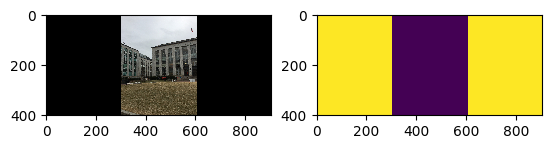

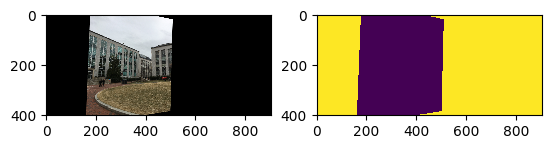

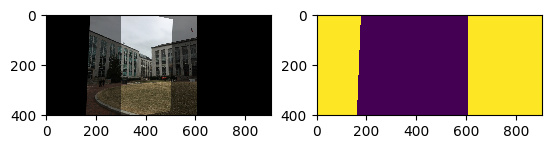

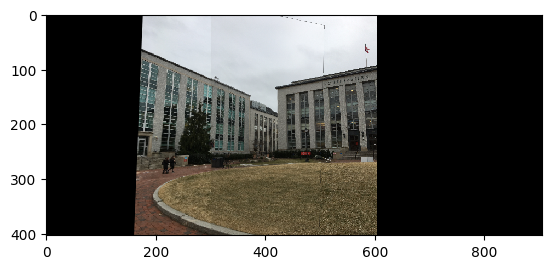

In [25]:
%matplotlib inline
# Combine outwards in towards image 3
im1_2_1 = PanoramaStuff(imgs["m1"], im1_to_2["im1"])
im1_2_2 = PanoramaStuff(imgs["m2"], im1_to_2["im2"])
im12, left_dx_12 = make_panorama(im1_2_1, im1_2_2, alpha=.5, insert_left=True)
plt.figure()
plt.imshow(im12)

H is good!
H is: [[ 6.78702720e-01 -1.74427071e-02  1.36587829e+02]
 [-2.21686411e-01  8.32891639e-01  2.13198614e+01]
 [-9.57183272e-04 -2.43044097e-04  1.00000000e+00]]


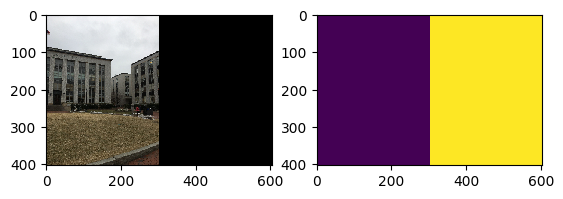

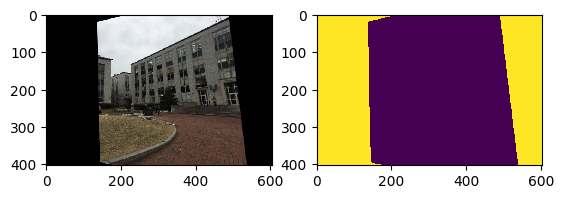

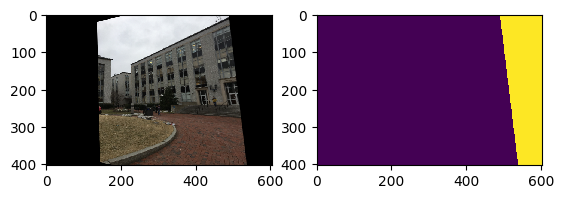

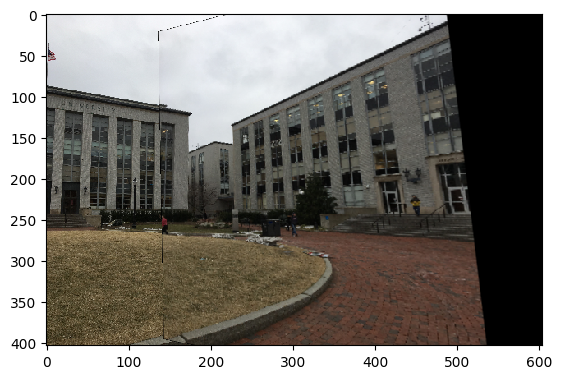

In [26]:
im4_5_4 = PanoramaStuff(imgs["m4"], im4_to_5["im4"])
im4_5_5 = PanoramaStuff(imgs["m5"], im4_to_5["im5"])
im45, left_dx_45 = make_panorama(im4_5_5 ,im4_5_4, alpha=0)
plt.figure()
plt.imshow(im45)

H is good!
H is: [[ 8.67135394e+00 -9.88795254e-02 -8.45839286e+02]
 [ 1.26312335e+00  3.86025090e+00 -6.79579318e+02]
 [ 5.06114081e-03  1.25482954e-04  1.00000000e+00]]


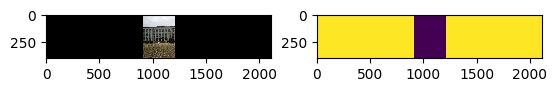

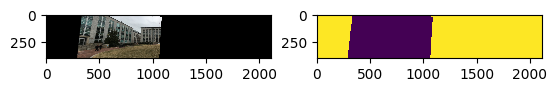

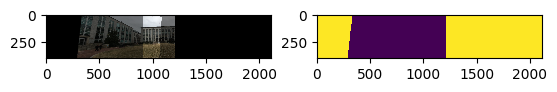

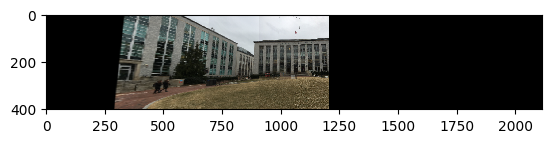

In [27]:
# Combine first order panos w/ 3
im12_stuff = PanoramaStuff(im12, shift_points(im2_to_3["im2"], left_dx_12))
im2_3_3 = PanoramaStuff(imgs["m3"], im2_to_3["im3"])
im123, left_dx_123 = make_panorama(im12_stuff, im2_3_3, alpha=0.5, insert_left=True)

plt.figure()
plt.imshow(im123)

### M2-5 into M1
If we continue warping the images on the right into the images on the right, the distortions
continue to mount. Here we show that by warping 2-5 all the way int 1, the images all the way 
to the left (image1) appear less distorted than the images all the way to the right. 
In particular, the image furthest to the right becomes **EXTREMELY** stretched and distorted!

H is good!
H is: [[ 6.29478986e-01  3.35437546e-02  1.51781936e+02]
 [-2.86453900e-01  8.69102365e-01  2.90037266e+01]
 [-1.14753851e-03 -1.13287161e-04  1.00000000e+00]]
H is good!
H is: [[ 6.10791970e-01  2.94541219e-02  1.28574965e+02]
 [-2.93153361e-01  8.07430879e-01  3.51557526e+01]
 [-1.20805271e-03 -9.90285874e-05  1.00000000e+00]]
H is good!
H is: [[ 7.56139350e-01  3.01990407e-02  9.44468239e+01]
 [-1.88077067e-01  9.23222716e-01  1.97378397e+01]
 [-8.21562126e-04  1.74479970e-05  1.00000000e+00]]


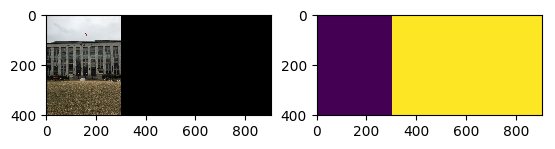

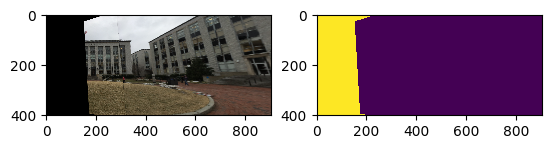

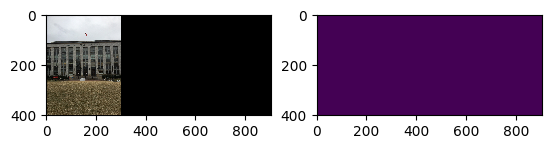

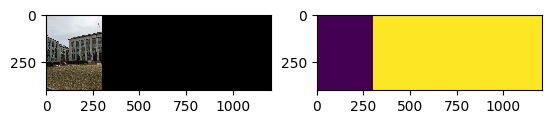

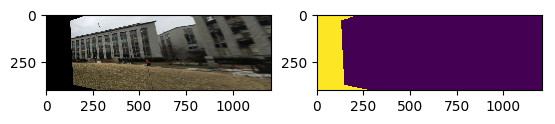

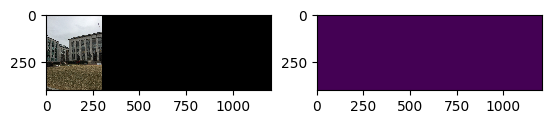

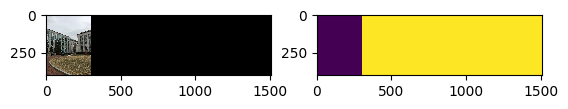

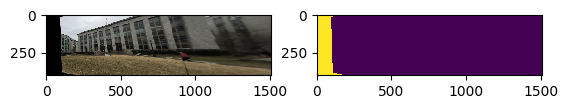

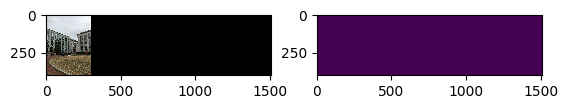

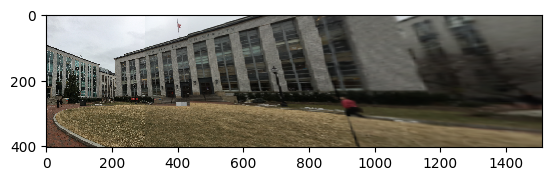

In [28]:
# Warp 2-5 into im1
im45_stuff = PanoramaStuff(im45, im3_to_4["im4"])
im3_4_3 = PanoramaStuff(imgs["m3"], shift_points(im3_to_4["im3"], left_dx_45))
im345, left_dx_345 = make_panorama(im45_stuff, im3_4_3, alpha=1)

im2_3_2 = PanoramaStuff(imgs["m2"], im2_to_3["im2"])
im345_stuff = PanoramaStuff(im345, shift_points(im2_to_3["im3"], left_dx_345))
im2345, left_dx_2345 = make_panorama(im345_stuff, im2_3_2, alpha=1)

im1_2_1 = PanoramaStuff(imgs["m1"], im1_to_2["im1"])
im2345_stuff = PanoramaStuff(im2345, shift_points(im1_to_2["im2"], left_dx_2345))
im12345, left_dx_12345= make_panorama(im2345_stuff, im1_2_1, alpha=1)

plt.figure()
plt.imshow(im12345)

H is good!
H is: [[-4.10190903e-01 -6.90944131e-02  1.05778194e+03]
 [-2.86453900e-01  8.69102365e-01  2.90037266e+01]
 [-1.14753851e-03 -1.13287161e-04  1.00000000e+00]]


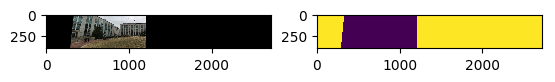

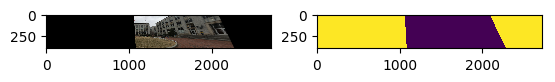

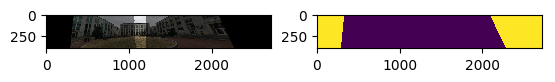

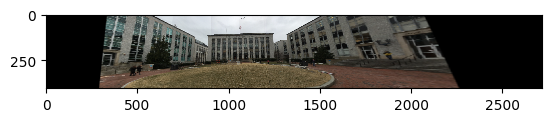

In [29]:
# Combine all into m3
im123_stuff = PanoramaStuff(im123, shift_points(im3_to_4["im3"], left_dx_123))
im45_stuff = PanoramaStuff(im45, shift_points(im3_to_4["im4"], left_dx_45))
im12345, im12345_dx = make_panorama(im45_stuff, im123_stuff, alpha=.5);

plt.figure()
plt.imshow(im12345)

In [30]:
# Write out
cv2.imwrite("total_pano.jpg", cv2.cvtColor(im12345, cv2.COLOR_RGB2BGR))

True

### On the topic of blending check out the classic paper by Burt and Adelson (attached)

And the real imagery that goes with it
http://graphics.cs.cmu.edu/courses/15-463/2005_fall/www/Lectures/Pyramids.pdf

In your python notebook write a 4-5 line explanation of how this method differs from the link above. 

## Comparing Blending Techniques
There are a couple of differences from the basic linear blending presented in the OpenCV documenation 
and the multiresolution spline presented in "A Multiresolution Spline With Application to Image Mosaics". 

The OpenCV function `addWeighted` simply takes two images and combines them by setting the value of each
pixel in the overlapping area equal to a constant ratio given by $\alpha$. 

This differes from the Multiresolution spline in a number of ways. The 
multiresolution spline algorithm applies a weighted average of the two images
as oppsed to a constant blend. Towards the center of the images (where there is the 
most overlap), the images blend at 50/50. As you move away from the mid point, the 
weighting becomes progressively more toward the image its moving towards until 
eventually, it is the only image used. The multiresolution spline uses a 
Gaussian pyramid to determine the weights used for the blending. 

-

-

-

-

# HW3


1.	Use a Harris corner detector (How many points should you pick?) and then match those points. 
    - Use SVD to compute a homography on the overconstrained linear equations that the feature points imply. Remake the mosaic.
    - Now use the cv2.homography with Ransac on the src and dst points after you match the feature points and remake the mosaic. 

In [31]:
# Load some easier images to work with....
folder = "imgs/skyline/"
fns = ['m1', 'm2', 'm3', 'm4', 'm5']
ftype = ".JPG"
imgs = {}
scale = .3

for file in fns:
    filename = folder + file + ftype
    imgs[file] = cv2.imread(filename)
    imgs[file] = bgr_to_rgb(imgs[file])
    imgs[file] = cv2.resize(imgs[file], (0,0), fx=scale, fy=scale)

In [32]:
# fns = ['m1', 'm2', 'm3', 'm4', 'm5']

blockSize = 15
sobelSize = 15
orb = cv2.ORB_create()
bf = cv2.BFMatcher(crossCheck=False)

def get_harris(img, blockSize=7, sobelSize=5, harris_k=.04):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    gray = np.float32(gray)
    dst = cv2.cornerHarris(gray,blockSize, sobelSize, harris_k)

    #result is dilated for marking the corners, not important
    dst = cv2.dilate(dst, None)
    
    # Threshold for an optimal value, it may vary depending on the image.
    # result_img = img.copy()
    # result_img[dst > 0.01 * dst.max()] = [0, 0, 255]

    # for each dst larger than threshold, make a keypoint out of it
    keypoints = np.argwhere(dst > 0.25 * dst.max())
    keypoints = [cv2.KeyPoint(x[1], x[0], 1) for x in keypoints]
    
    return (keypoints, dst)

def get_orb(img, blockSize=None, sobelSize=None):
    kp, dst = orb.detectAndCompute(img, None)
    return (kp, dst)


def get_mins(shape, h):
    tl = [0, 0, 1]
    tr = [0, shape[1], 1]
    bl = [shape[0], 0, 1]
    br = [shape[0], shape[1], 1]

    corners = np.hstack(
                    [np.array(tl).reshape(3, 1),
                    np.array(tr).reshape(3, 1),
                    np.array(bl).reshape(3, 1),
                    np.array(br).reshape(3, 1)])
    new_corners = np.matmul(h, corners)

    min_x = int(min(new_corners[0, :]))
    min_y = int(min(new_corners[1, :]))

    return (min_x, min_y)

def dest_shift(dest, min_x, min_y):
    shift_x = min(0, min_x)
    shift_x = abs(shift_x)
    shift_y = min(0, min_y)
    shift_y = abs(shift_y)
    
    shift = np.eye(3)
    shift[0, 2] = shift_x
    shift[1, 2] = shift_y
    
    dest_height, dest_width, dest_channels = dest.shape
    
    warped_image = cv2.warpPerspective(dest, shift, (dest_width + shift_x, dest_height + shift_y))
    return (warped_image, shift)
        

def make_panorama(src, dest, h):    
    min_x, min_y = get_mins(src.shape, h)
    dest, shift = dest_shift(dest, min_x, min_y)
    H = np.matmul(shift, h)
    
    src_height, src_width, src_channels = src.shape
    dest_height, dest_width, dest_channels = dest.shape
    
    warped_image = cv2.warpPerspective(src, H, (src_width + dest_width, dest_height))
    
    # Threshold the HSV image to get only black colors
    # black_mask = cv2.inRange(warped_image, 0, 0)
    # im_mask = cv2.bitwise_not(black_mask)
    #combined = combine_via_mask(im_out, dest.image, im_mask)
    
    # Put the dest_image ON TOP OF the warped image
    combined = combine_images(dest, warped_image, alpha=0);
    return combined

def h_from_orb(im_src, im_dest, show_intermediate=False, use_svd=False):
    plt.figure()
    kp_m1, dst_m1 = get_orb(im_src)
    kp_m2, dst_m2 = get_orb(im_dest)

    matches = bf.match(dst_m1, dst_m2)
    matches = sorted(matches, key = lambda x:x.distance)
    print(len(matches))

    # cv2.drawMatchesKnn expects list of lists as matches.
    im_out = cv2.drawMatches(im_src, kp_m1, im_dest, kp_m2, matches, None, flags=2)
    
    if show_intermediate:
        plt.figure(figsize=(18, 16))
        plt.imshow(im_out)
    
    list_kp1 = np.array([kp_m1[mat.queryIdx].pt for mat in matches])
    list_kp2 = np.array([kp_m2[mat.trainIdx].pt for mat in matches])

    if use_svd:
        p1 = arr2pts(list_kp1)
        p2 = arr2pts(list_kp2)
        M = find_h_svd(p1, p2)
    else:
        M, mask = cv2.findHomography(list_kp1, list_kp2, cv2.RANSAC)
    
    return M

## H from SVD

![SVD Equation](svd.png)


In [34]:
def make_x_row_svd(src: Point, dest: Point):
    return np.array([-src.x, -src.y, -1, 0, 0, 0, src.x*dest.x, src.y*dest.x, dest.x])

def make_y_row_svd(src: Point, dest: Point):
    return np.array([0, 0, 0, -src.x, -src.y, -1, src.x*dest.y, src.y*dest.y, dest.y])

def make_a_svd(src_pts, dest_pts):
    assert(len(src_pts) == len(dest_pts))
    A = None
    
    for index in range(len(src_pts)): 
        x_row = make_x_row_svd(src_pts[index], dest_pts[index])
        y_row = make_y_row_svd(src_pts[index], dest_pts[index])
        if A is None:
            A = np.array([x_row, y_row]) 
        else:
            A = np.vstack([A, x_row, y_row])
    return A

def arr2pts(lpoints):
    return [Point(pt[0], pt[1]) for pt in lpoints]

def find_h_svd(src_pts, dest_pts):
    A = make_a_svd(src_pts, dest_pts)
    u, s, vh = np.linalg.svd(A)
    print("s: " + str(s[7]))
    h = vh[-1,:] / vh[-1,-1] # last row normalized by first entry
    h = np.reshape(h, (3,3))
    return h

h_svd = find_h_svd(image2_points, image1_points)

A = make_a(image2_points, image1_points)
b = make_b(image1_points)
h = find_h(A, b)

print("via SVD: \n" + str(h_svd))
print("via solve: \n" + str(h))

s: 1.3383316164831067
via SVD: 
[[ 6.54849095e-01  8.10436440e-02  5.20568545e+02]
 [-2.19527822e-01  1.43205676e+00  4.78002003e+02]
 [-3.00789714e-04  2.12518699e-05  1.00000000e+00]]
via solve: 
[[ 6.56399464e-01  8.24164254e-02  5.20306263e+02]
 [-2.18414729e-01  1.43428370e+00  4.77721127e+02]
 [-2.99775701e-04  2.26542946e-05  1.00000000e+00]]


Here we show that using the SVD of the inhomogenous equation can work to find the homogoraphy. We compared the 
results to our first method of calculating the homography to great affect!

500
500
s: 4.006540105985793


<Figure size 640x480 with 0 Axes>

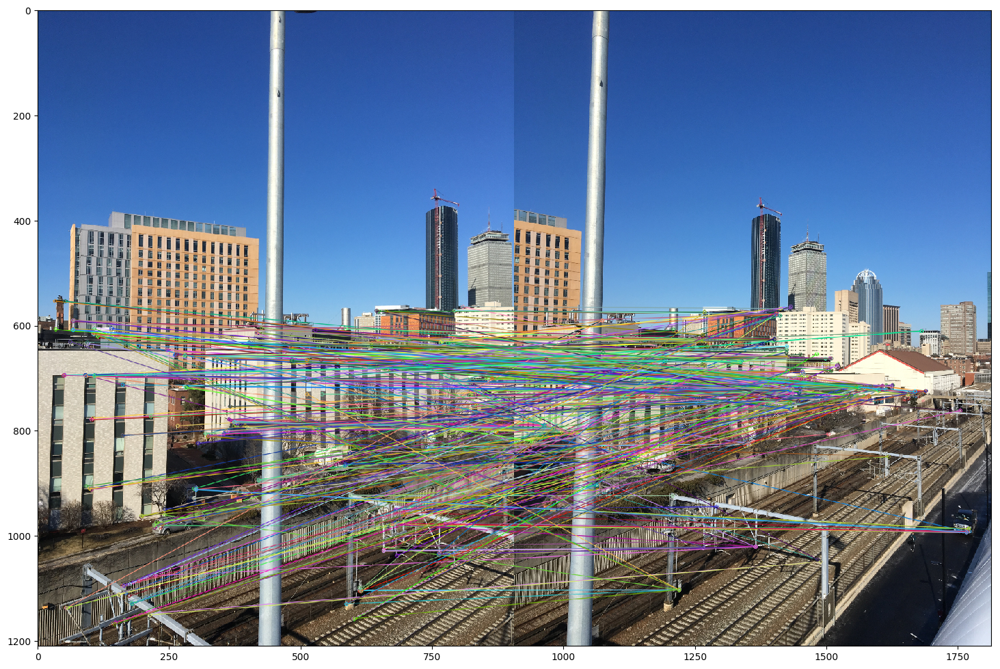

<Figure size 640x480 with 0 Axes>

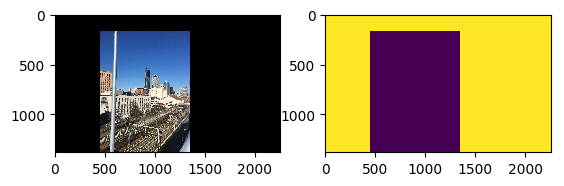

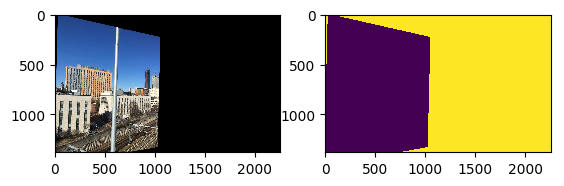

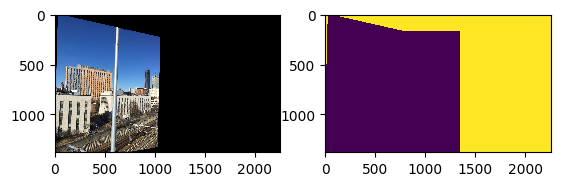

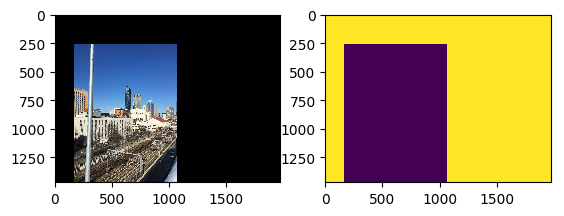

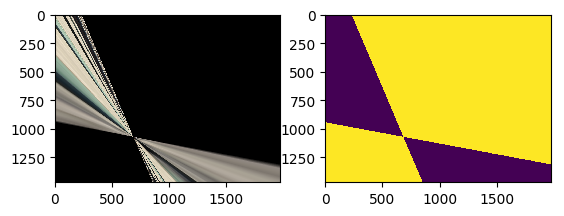

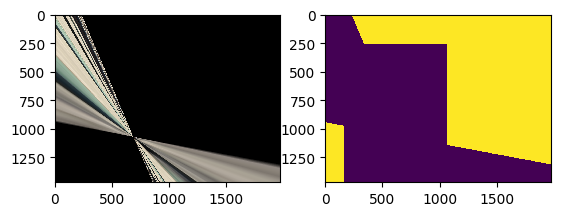

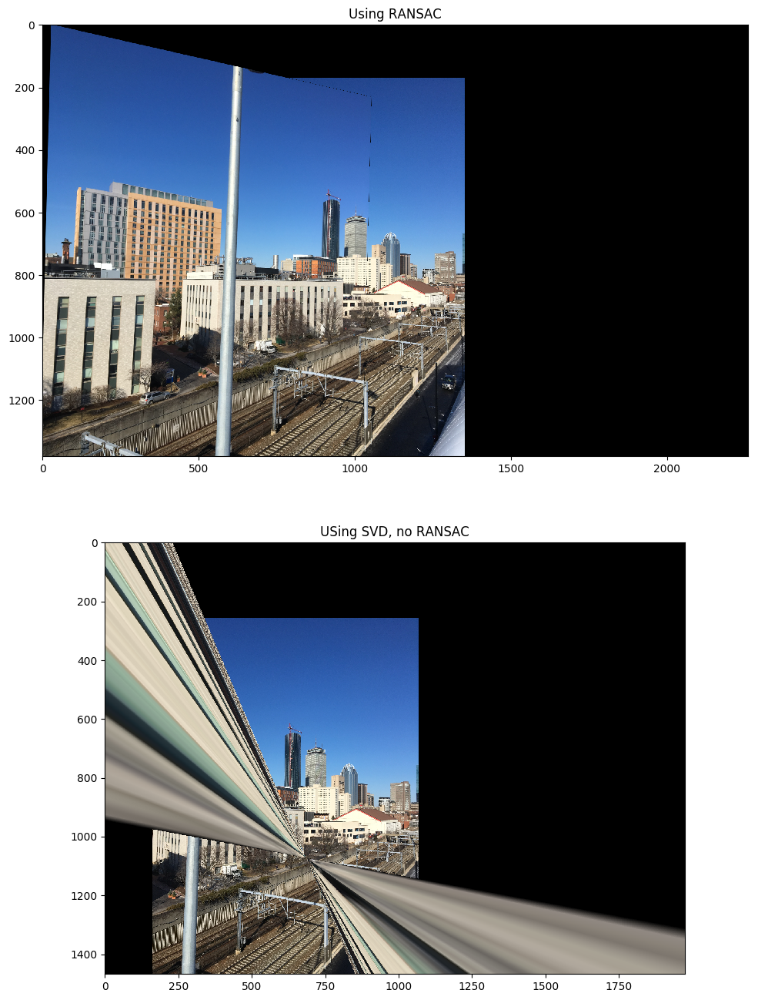

In [35]:
h_im12 = h_from_orb(imgs["m1"], imgs["m2"], True)
h_im12_svd = h_from_orb(imgs["m1"], imgs["m2"], False, True)

im12 = make_panorama(imgs["m1"], imgs["m2"], h_im12)
im12_svd = make_panorama(imgs["m1"], imgs["m2"], h_im12_svd)
plt.figure(figsize=(18, 16))
ax = plt.subplot(211)
ax.set_title("Using RANSAC")
plt.imshow(im12)
ax = plt.subplot(212)
ax.set_title("USing SVD, no RANSAC")
plt.imshow(im12_svd)

## Lack of RANSAC in SVD Homography Calculations

While the SVD method of calculating the homographies works, we have not implemented RANSAC to filter out
bad matches between photos. As a result, our data is fairly messy and results in a bad transform!

500


<Figure size 640x480 with 0 Axes>

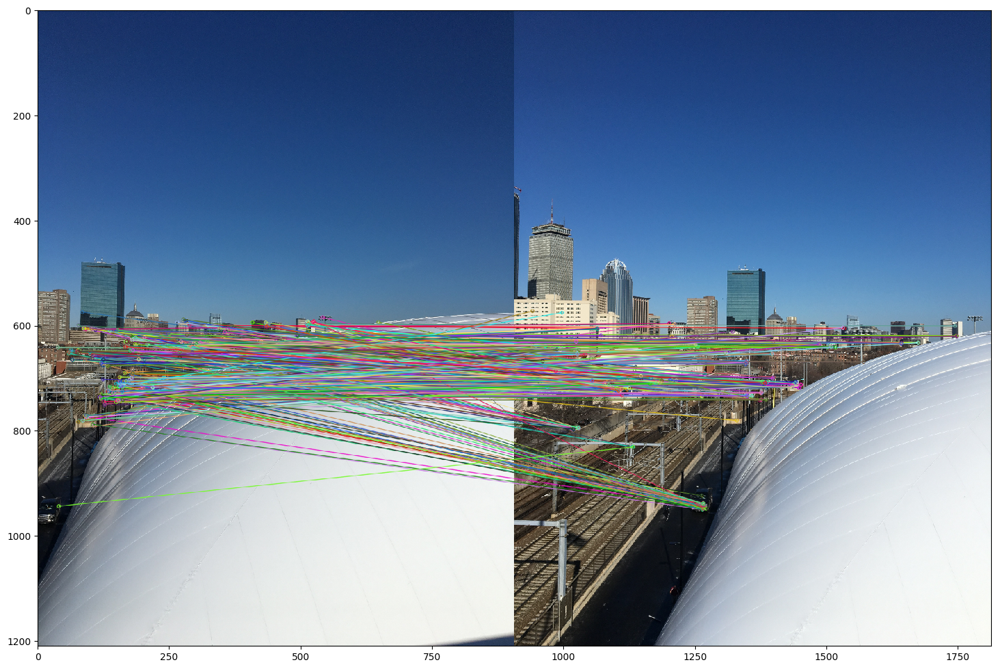

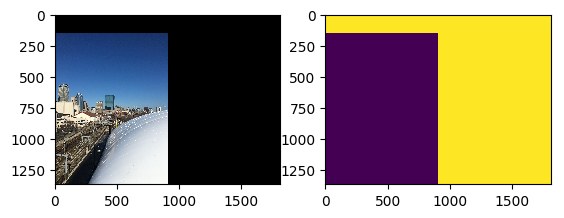

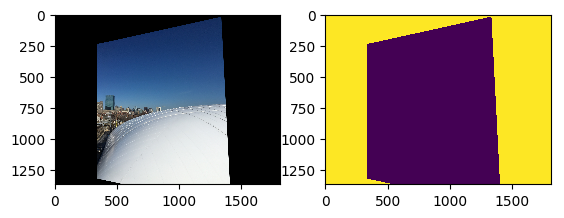

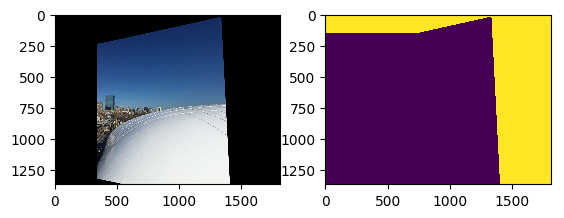

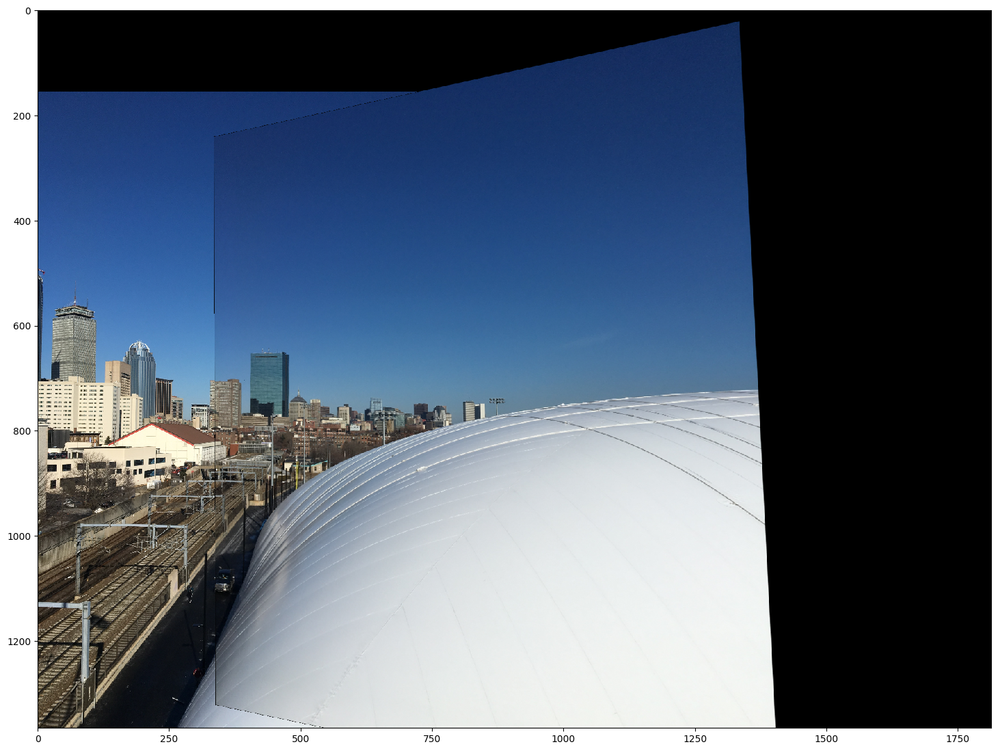

In [36]:
h_im45 = h_from_orb(imgs["m5"], imgs["m4"], True)
im45 = make_panorama(imgs["m5"], imgs["m4"], h_im45)
plt.figure(figsize=(18, 16))
plt.imshow(im45)

500


<Figure size 640x480 with 0 Axes>

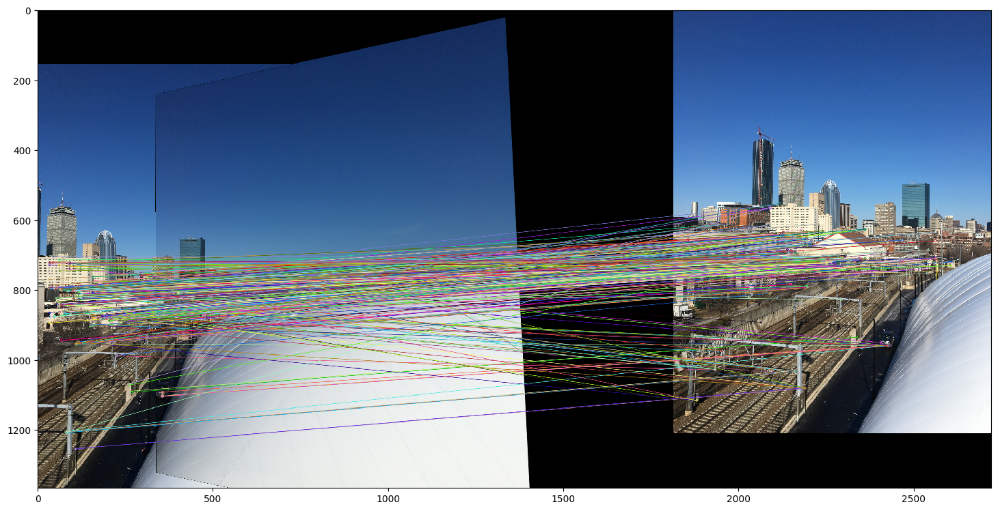

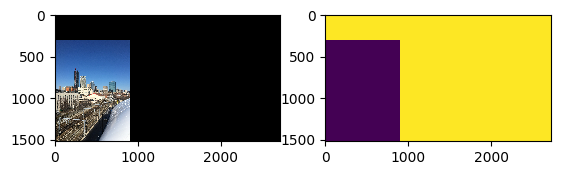

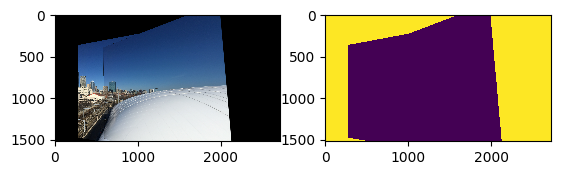

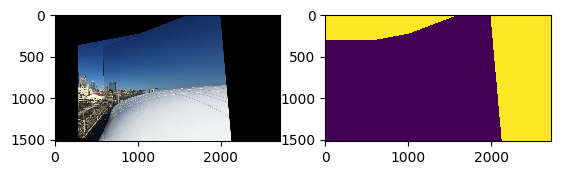

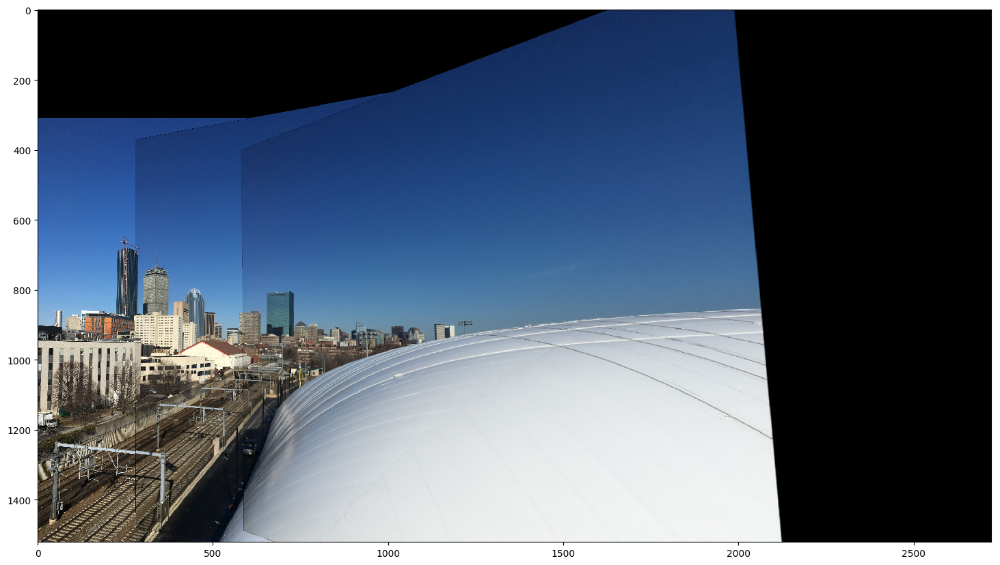

In [37]:
h_34 = h_from_orb(im45, imgs["m3"], True)
im345 = make_panorama(im45, imgs["m3"], h_34)
plt.figure(figsize=(18, 16))
plt.imshow(im345)

500


<Figure size 640x480 with 0 Axes>

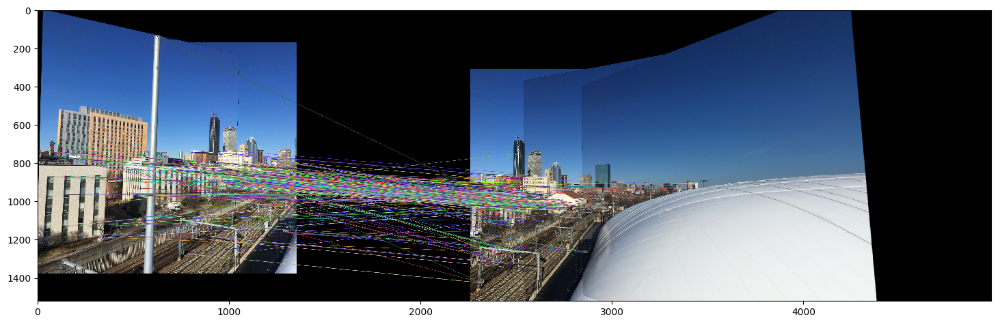

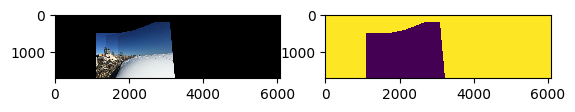

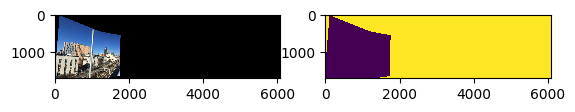

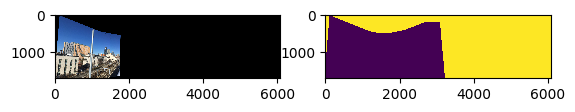

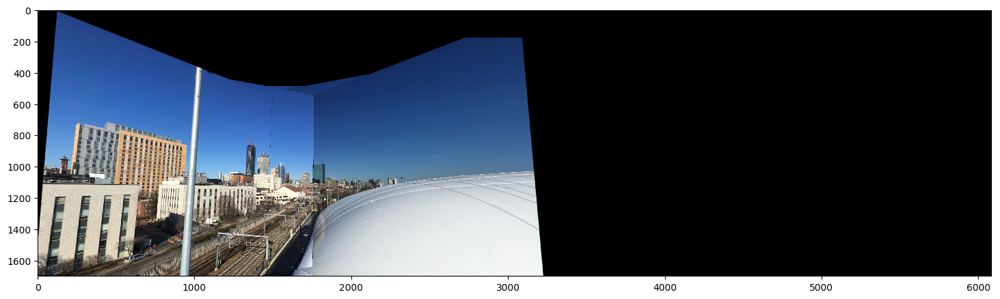

In [38]:
h_12345 = h_from_orb(im12, im345, True)
im12345 = make_panorama(im12, im345, h_12345)
plt.figure(figsize=(18, 16))
plt.imshow(im12345)

In [39]:
cv2.imwrite("auto_feature.jpg", cv2.cvtColor(im12345, cv2.COLOR_RGB2BGR))

True

2.	See the attached code for an example on how to open your webcam on your computer and see if you can now do this with video. Profile your algorithm in terms of 
    - how fast (fps) you can go and 
    - try and figure out how much time each component takes to run. 



## Harris Live Stream
![Harris Live Stream](harris.gif)


*For source code, see webcam.py, not the python notebook*